<a href="https://colab.research.google.com/github/Kaivalyaajmire07/Kaivalyaajmire07/blob/main/LEVEL1_Cognifyz_intership_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Level 1**

In [2]:
#import Liberies
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

import geopandas as gpd
import folium


# Task 1 : Data Exploration and Preprocessing

In [4]:
df = pd.read_csv('/content/Dataset  (1).csv')
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [6]:
# Check Row and colume
df.shape
print("Rows:", df.shape[0])
print("Columns:", df.shape[1])


Rows: 9551
Columns: 21


In [7]:
# Check missing values
print("Missing values before handling:\n")
print(df.isnull().sum())

# Separate column types
num_cols = df.select_dtypes(include=["int64", "float64"]).columns
cat_cols = df.select_dtypes(include=["object"]).columns

# Fill numerical columns (choose ONE)
df[num_cols] = df[num_cols].fillna(df[num_cols].mean())      # Mean
# df[num_cols] = df[num_cols].fillna(df[num_cols].median())  # Median

# Fill categorical columns with Mode
for col in cat_cols:
    df[col] = df[col].fillna(df[col].mode()[0])

# Verify
print("\nMissing values after handling:\n")
print(df.isnull().sum())


Missing values before handling:

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

Missing values after handling:

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is deliveri

In [8]:
# Check data types
print(df.dtypes)

# Convert Aggregate rating to numeric (safe conversion)
df["Aggregate rating"] = pd.to_numeric(df["Aggregate rating"], errors="coerce")


Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object


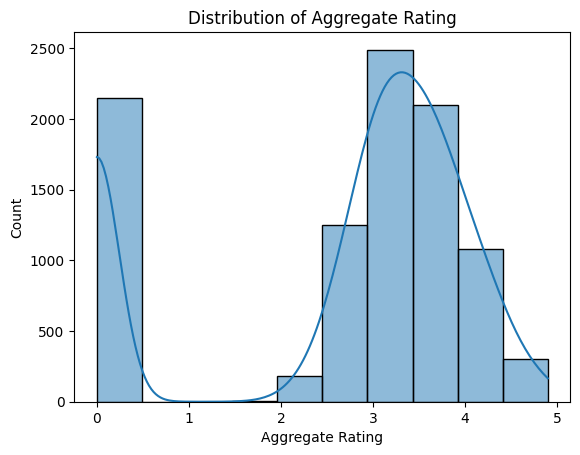

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# Histogram
plt.figure()
sns.histplot(df["Aggregate rating"], bins=10, kde=True)
plt.title("Distribution of Aggregate Rating")
plt.xlabel("Aggregate Rating")
plt.ylabel("Count")
plt.show()


In [10]:
rating_counts = df["Aggregate rating"].value_counts()

print("Rating counts:\n", rating_counts)
print("\nPercentage distribution:\n", (rating_counts / rating_counts.sum()) * 100)


Rating counts:
 Aggregate rating
0.0    2148
3.2     522
3.1     519
3.4     498
3.3     483
3.5     480
3.0     468
3.6     458
3.7     427
3.8     400
2.9     381
3.9     335
2.8     315
4.1     274
4.0     266
2.7     250
4.2     221
2.6     191
4.3     174
4.4     144
2.5     110
4.5      95
2.4      87
4.6      78
4.9      61
2.3      47
4.7      42
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: count, dtype: int64

Percentage distribution:
 Aggregate rating
0.0    22.489792
3.2     5.465396
3.1     5.433986
3.4     5.214114
3.3     5.057062
3.5     5.025652
3.0     4.900010
3.6     4.795309
3.7     4.470736
3.8     4.188043
2.9     3.989111
3.9     3.507486
2.8     3.298084
4.1     2.868810
4.0     2.785049
2.7     2.617527
4.2     2.313894
2.6     1.999791
4.3     1.821799
4.4     1.507696
2.5     1.151712
4.5     0.994660
2.4     0.910899
4.6     0.816668
4.9     0.638677
2.3     0.492095
4.7     0.439745
2.2     0.282693
4.8     0.261753
2.1     

In [11]:
# Analyze the distribution of target variable
print(df['Aggregate rating'].describe())

count    9551.000000
mean        2.666370
std         1.516378
min         0.000000
25%         2.500000
50%         3.200000
75%         3.700000
max         4.900000
Name: Aggregate rating, dtype: float64


# Task 2 : Descriptive Analysis

In [12]:
# Basic statistics
stats = df.describe()
print(stats)

# Individual measures (optional)
print("Mean:\n", df.mean(numeric_only=True))
print("\nMedian:\n", df.median(numeric_only=True))
print("\nStandard Deviation:\n", df.std(numeric_only=True))


       Restaurant ID  Country Code    Longitude     Latitude  \
count   9.551000e+03   9551.000000  9551.000000  9551.000000   
mean    9.051128e+06     18.365616    64.126574    25.854381   
std     8.791521e+06     56.750546    41.467058    11.007935   
min     5.300000e+01      1.000000  -157.948486   -41.330428   
25%     3.019625e+05      1.000000    77.081343    28.478713   
50%     6.004089e+06      1.000000    77.191964    28.570469   
75%     1.835229e+07      1.000000    77.282006    28.642758   
max     1.850065e+07    216.000000   174.832089    55.976980   

       Average Cost for two  Price range  Aggregate rating         Votes  
count           9551.000000  9551.000000       9551.000000   9551.000000  
mean            1199.210763     1.804837          2.666370    156.909748  
std            16121.183073     0.905609          1.516378    430.169145  
min                0.000000     1.000000          0.000000      0.000000  
25%              250.000000     1.000000        

In [13]:
# Country Code distribution
print("\nCountry Code Distribution:\n")
print(df["Country Code"].value_counts())

# City distribution
print("\nCity Distribution:\n")
print(df["City"].value_counts())

# Cuisines distribution
print("\nCuisines Distribution:\n")
print(df["Cuisines"].value_counts())



Country Code Distribution:

Country Code
1      8652
216     434
215      80
30       60
189      60
214      60
148      40
208      34
14       24
162      22
94       21
166      20
184      20
191      20
37        4
Name: count, dtype: int64

City Distribution:

City
New Delhi         5473
Gurgaon           1118
Noida             1080
Faridabad          251
Ghaziabad           25
                  ... 
Lakes Entrance       1
Mohali               1
Panchkula            1
Bandung              1
Randburg             1
Name: count, Length: 141, dtype: int64

Cuisines Distribution:

Cuisines
North Indian                          945
North Indian, Chinese                 511
Fast Food                             354
Chinese                               354
North Indian, Mughlai                 334
                                     ... 
World Cuisine, Patisserie, Cafe         1
Burger, Izgara                          1
Desserts, B�_rek                        1
Restaurant Cafe, Turki

In [14]:
#Top 10 Cities
top_cities = df["City"].value_counts().head(10)
print("\nTop 10 Cities with Most Restaurants:\n", top_cities)



Top 10 Cities with Most Restaurants:
 City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Lucknow           21
Ahmedabad         21
Amritsar          21
Guwahati          21
Name: count, dtype: int64


In [15]:
#Top 10 Cuisines
top_cuisines = df["Cuisines"].value_counts().head(10)
print("\nTop 10 Cuisines with Most Restaurants:\n", top_cuisines)



Top 10 Cuisines with Most Restaurants:
 Cuisines
North Indian                      945
North Indian, Chinese             511
Fast Food                         354
Chinese                           354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64


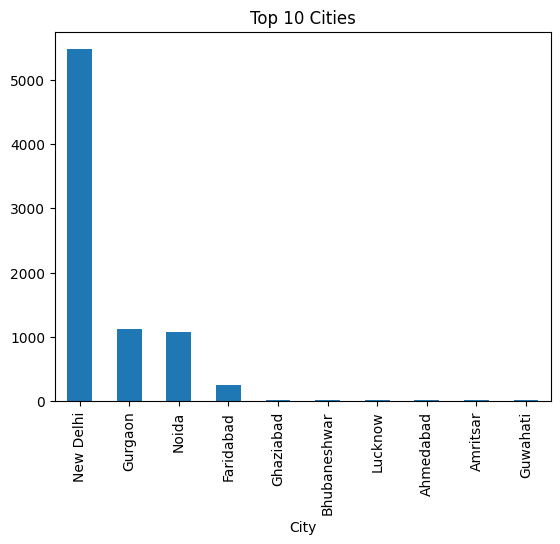

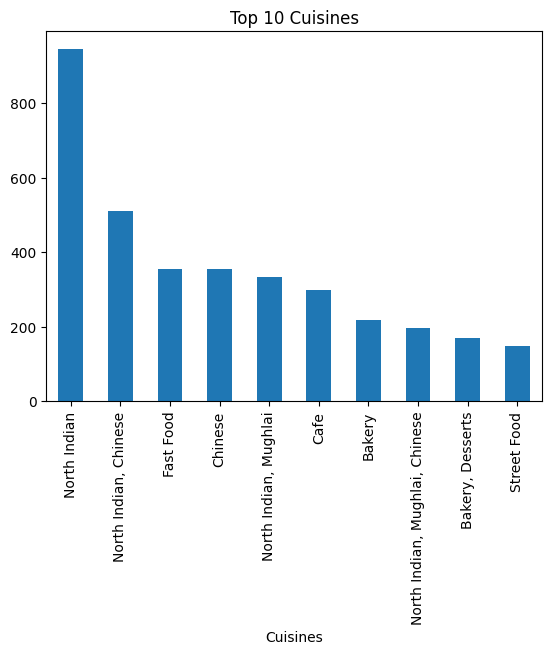

In [16]:
# Top cities plot
top_cities.plot(kind="bar", title="Top 10 Cities")
plt.show()

# Top cuisines plot
top_cuisines.plot(kind="bar", title="Top 10 Cuisines")
plt.show()


## Task 3: Geospatial Analysis


In [22]:
# Center map
map_center = [df["Latitude"].mean(), df["Longitude"].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=5)

for _, row in df.iterrows():
    # Safely convert restaurant name to English-readable text
    name = str(row["Restaurant Name"]).encode("ascii", errors="ignore").decode()

    rating = row["Aggregate rating"]

    folium.CircleMarker(
        location=[row["Latitude"], row["Longitude"]],
        radius=3,
        popup=f"Name: {name}<br>Rating: {rating}",
        fill=True,
        fill_opacity=0.7
    ).add_to(restaurant_map)

restaurant_map


City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Lucknow           21
Ahmedabad         21
Amritsar          21
Guwahati          21
Name: count, dtype: int64


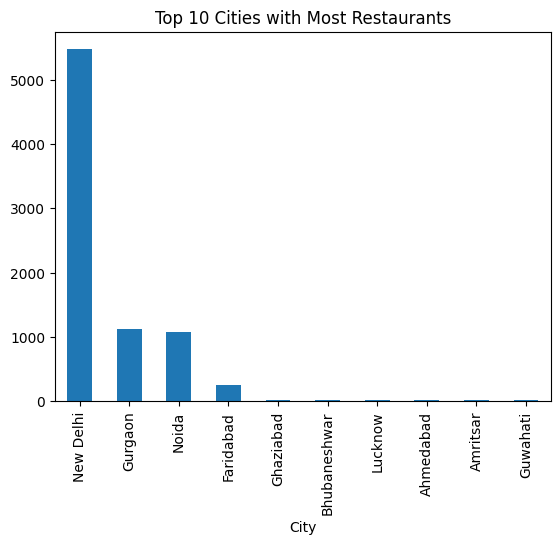

In [24]:
#Top 10 Cities with Most Restaurants
city_counts = df["City"].value_counts().head(10)
print(city_counts)

city_counts.plot(kind="bar", title="Top 10 Cities with Most Restaurants")
plt.show()


Country Code
1      8652
216     434
215      80
30       60
189      60
214      60
148      40
208      34
14       24
162      22
94       21
166      20
184      20
191      20
37        4
Name: count, dtype: int64


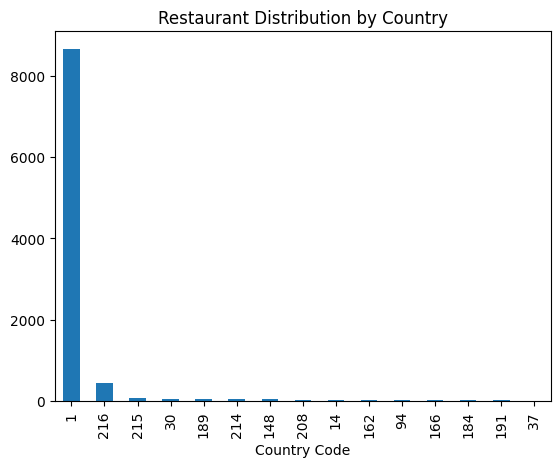

In [25]:
#Restaurant Distribution by Country
country_counts = df["Country Code"].value_counts()
print(country_counts)

country_counts.plot(kind="bar", title="Restaurant Distribution by Country")
plt.show()


In [26]:
#Correlation Between Location & Rating
correlation = df[["Latitude", "Longitude", "Aggregate rating"]].corr()
print(correlation)


                  Latitude  Longitude  Aggregate rating
Latitude          1.000000   0.043207          0.000516
Longitude         0.043207   1.000000         -0.116818
Aggregate rating  0.000516  -0.116818          1.000000


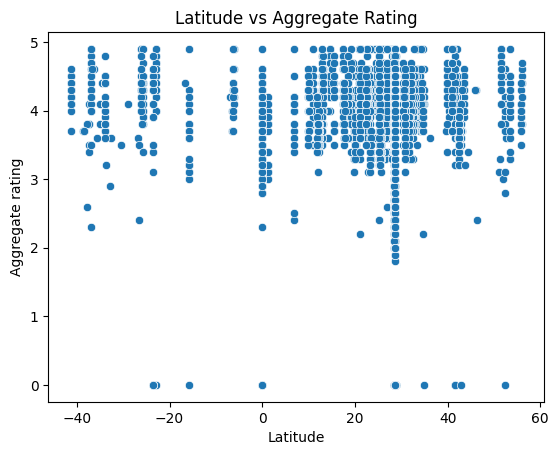

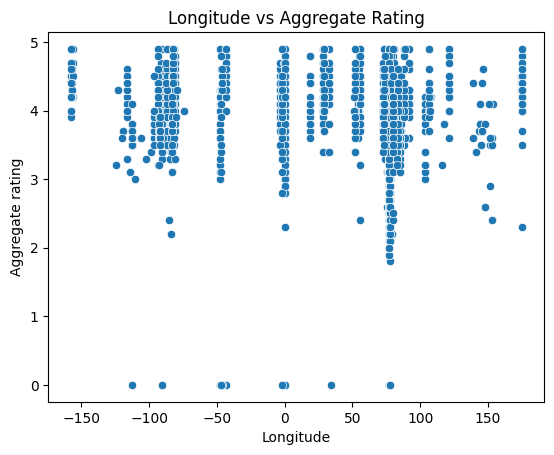

In [27]:
#Scatter Plot (Location vs Rating)
sns.scatterplot(x="Latitude", y="Aggregate rating", data=df)
plt.title("Latitude vs Aggregate Rating")
plt.show()

sns.scatterplot(x="Longitude", y="Aggregate rating", data=df)
plt.title("Longitude vs Aggregate Rating")
plt.show()
